# EM VS DBSCAN VS isolated random forest ( Log + StandardScaling )

## Imports

In [18]:
from plotnine import *

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math
from numpy.linalg import norm
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
%matplotlib inline

sns.set()
warnings.filterwarnings("ignore")

## Functions

In [19]:
def multiple_histogram(data):
    
    num_row = math.ceil(len(data.columns) / 3)
    fig = make_subplots(rows=num_row, cols=3,subplot_titles=(df.columns))

    place_col = 1
    place_row = 1
    for i in data.columns:

        fig.add_trace(go.Histogram(x=data[i]),row=place_row, col=place_col)

        place_col += 1
        if place_col == 4:
            place_col = 1
            place_row += 1
    return fig.update_layout(height=1600, width=1100,
                          title_text="Multiple Histogram for all featrues")



def multiple_boxplot(data):
    
    num_row = math.ceil(len(data.columns) / 3)
    fig = make_subplots(rows=num_row, cols=3,subplot_titles=(df.columns))

    place_col = 1
    place_row = 1
    for i in data.columns:

        fig.add_trace(go.Box(y=data[i]),row=place_row, col=place_col)

        place_col += 1
        if place_col == 4:
            place_col = 1
            place_row += 1
    return fig.update_layout(height=1600, width=1100,
                          title_text="Multiple Histogram for all featrues")

def check_nulls(X_data):
    
    unusual_nulls = X_data[X_data.isin(['{}','[]', "?", ".", "-", "_", "", " ", "  "])].sum()

    nulls_df = pd.concat([X_data.isna().sum(), unusual_nulls], axis=1)
    nulls_df.columns = ["usual_nulls", "strange_nulls"]
    nulls_df = nulls_df.sort_values('usual_nulls', ascending = False)
    return nulls_df

########################################################

def kMeansInitCentroids(X, K):
   
    centroids=np.zeros((K, X.shape[1]))
    sample_size = int(X.shape[0]/K)
    
    for i in range(K):
        
        index = np.random.randint(X.shape[0], size=sample_size)
        
        new_centriod = sum(X[index])/sample_size
        centroids[i, :]=new_centriod
   
    return centroids


def findClosestCentroids(X, centroids):
    
    matrix=np.zeros((X.shape[0], centroids.shape[0]))
    for i in range(centroids.shape[0]):
        
        diffrences = X-centroids[i]
        norm_vector = np.linalg.norm(diffrences, axis=1)
        
        matrix[:,i]=norm_vector
    idx=np.argmin(matrix, axis=1).reshape(-1,1)
    
    return idx


def computeCentroids(X, idx, K, centroids_old):
    
    centroids=np.zeros((K, X.shape[1]))
    idx = idx.reshape(X.shape[0])
    
    for i in range(K):
        if len(X[idx==i]) ==0:
            centroids[i] = centroids_old[i]
        else:
            centroids[i]=np.mean(X[idx==i], axis=0)

    return centroids

def k_means(X,K):
    
    X_data = pd.DataFrame(X)
    
    list_of_idx=[]
    list_of_centroids=[]
    list_of_sse=[]
    
    for j in range(100):
        centroids = kMeansInitCentroids(X, K)
        inertia = 0

        for i in range(300):

            idx = findClosestCentroids(X, centroids)
            centroids = computeCentroids(X, idx, K, centroids)

        for i in range(K):
            if len(X_data[idx==i]) == 0:
                continue
            else:
                diff= X_data[idx==i]-centroids[i]
                inertia += sum(np.square(norm(diff, axis=1)))
                
        list_of_idx.append(idx)
        list_of_centroids.append(centroids)
        list_of_sse.append(inertia)
    
    min_sse_index = np.argmin(list_of_sse)
    
    return list_of_centroids[min_sse_index], list_of_idx[min_sse_index], min(list_of_sse)



def elbow(X, K):
    
    import plotly.express as px
    variances=[]
    for i in range(1, K+1):
        
        centroids, idx, variance = k_means(X, i)
        variances.append(variance)
        
    return px.line(x=np.arange(1,K+1), y=variances, markers=True,labels ={'x':"number of cetriods", 'y':"Inertia"},
                                       range_y=[0, max(variances)+200] ,title="Sum of variances VS number of Cenriods in agiven data set")

def predict(centroids,X):
    
    matrix=np.zeros((X.shape[0], centroids.shape[0]))
    
    for i in range(centroids.shape[0]):
        
        diffrences = X-centroids[i]
        norm_vector = np.linalg.norm(diffrences, axis=1)
        
        matrix[:,i]=norm_vector
    label=np.argmin(matrix, axis=1).reshape(-1,1)

    return label

## Data Loading & EDA

In [20]:
#read the data
df = pd.read_csv('../Data/CC GENERAL.csv')
df.drop('CUST_ID', axis=1, inplace=True)
print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 17)


In [21]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [22]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [23]:
check_nulls(df)

,usual_nulls,strange_nulls
MINIMUM_PAYMENTS,313,0.0
CREDIT_LIMIT,1,0.0
BALANCE,0,0.0
CASH_ADVANCE_FREQUENCY,0,0.0
PRC_FULL_PAYMENT,0,0.0
PAYMENTS,0,0.0
PURCHASES_TRX,0,0.0
CASH_ADVANCE_TRX,0,0.0
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.0
BALANCE_FREQUENCY,0,0.0


In [24]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [25]:
multiple_histogram(df)

In [26]:
multiple_boxplot(df)

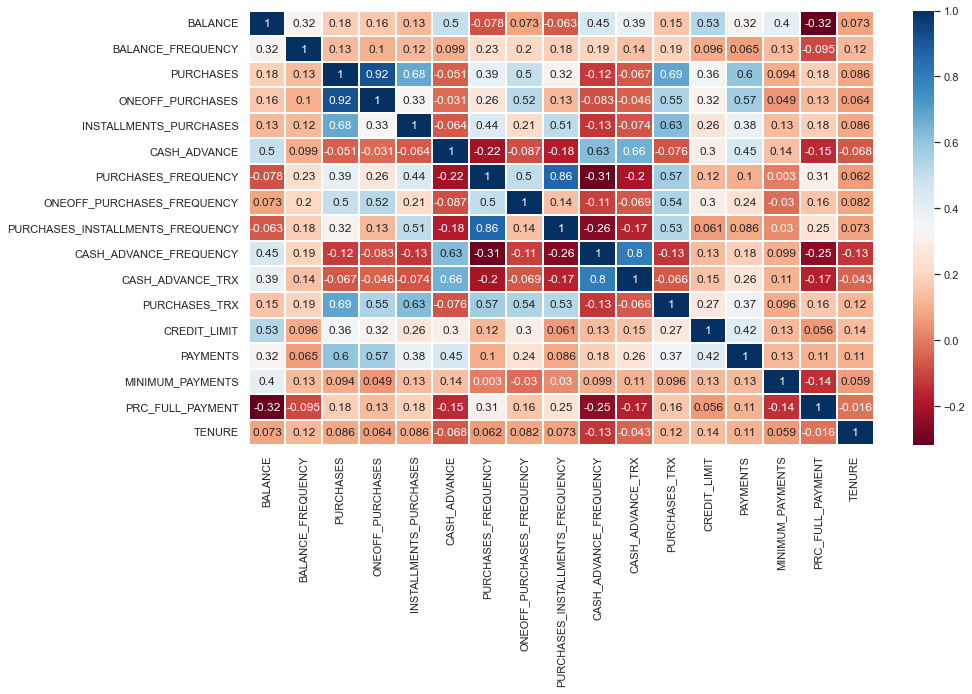

In [27]:
plt.figure(figsize = (14,8))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,  cmap= 'RdBu');

In [28]:
#make a copy for the original dataset
df_copy=df.copy()

In [29]:
#solution 
df_copy.dropna(axis =0, inplace =True )
df_copy.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [30]:
df_logged = np.log1p(df_copy)

from sklearn.preprocessing import StandardScaler

scal = StandardScaler()
df_scaled = scal.fit_transform(df_logged)

In [31]:
from sklearn.manifold import TSNE

tsne_projection = TSNE(n_components=2, 
                       perplexity=30, 
                       learning_rate=1, 
                       init='pca', 
                       method='barnes_hut', 
                       n_jobs=-1, 
                       n_iter=10**4, 
                       random_state=42).fit_transform(df_scaled)

In [32]:
from sklearn.decomposition import PCA

pca_scaled = PCA()
df_scaled_red = pca_scaled.fit_transform(df_scaled)

d = {'Number of EigenVector': np.arange(1,len(df_copy.columns)+1), 'Varaiability Captured': np.cumsum(pca_scaled.explained_variance_ratio_)}
df = pd.DataFrame(data=d)
px.line(df, x='Number of EigenVector', y='Varaiability Captured',markers=True,
                       title='EigenVectors VS Varaiability Captured')

In [33]:
pca_scaled = PCA(n_components=11)
df_scaled_red = pca_scaled.fit_transform(df_scaled)

# IsolationForest

In [34]:
from sklearn.ensemble import IsolationForest
clf = IsolationForest(n_estimators=50,random_state=42,bootstrap=True, n_jobs=-1).fit(df_scaled_red)
y_IsoPre = clf.predict(df_scaled_red)
y_IsoPre

array([ 1,  1, -1, ..., -1, -1,  1])

In [35]:
tsne_projection = pd.DataFrame(tsne_projection, columns=['feature1', 'feature2'],index=df_copy.index.tolist())
tsne_projection['y'] = (y_IsoPre).tolist()
tsne_projection.replace(-1, "anamoly", inplace=True)
px.scatter(tsne_projection, x='feature1', y='feature2', color="y")

# DBSCAN

In [37]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

# we ask for mins + 1 nearest, because the data point it self (distance = 0) is included
mins = 5
knn = NearestNeighbors( n_neighbors=mins + 1)

knn.fit(df_scaled_red)

distances, neighbors = knn.kneighbors(df_scaled_red)

# sort the distances
distances = np.sort(distances[:, mins], axis = 0)
distances

array([0.16553512, 0.16981193, 0.1773818 , ..., 3.97813185, 4.11063425,
       4.3284874 ])

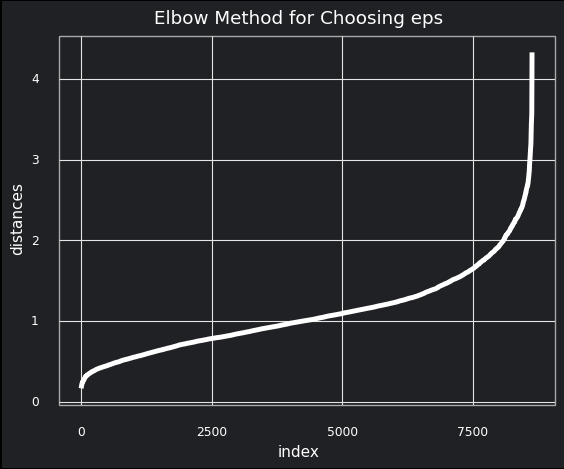

<ggplot: (74112765496)>

In [38]:
#plot the distances
distances_df = pd.DataFrame({"distances": distances,
                             "index": list(range(0,len(distances)))})
plt = (ggplot(distances_df, aes(x = "index", y = "distances")) +
 geom_line(color = "white", size = 2) + theme_minimal() +
 labs(title = "Elbow Method for Choosing eps") +
 theme(panel_grid_minor = element_blank(),
      rect = element_rect(fill = "#202124ff"),
      axis_text = element_text(color = "white"),
      axis_title = element_text(color = "white"),
      plot_title = element_text(color = "white"),
      panel_border = element_line(color = "darkgray"),
      plot_background = element_rect(fill = "#202124ff")
      ))
ggsave(plot=plt, filename='elbow.png', dpi=300)

plt

In [39]:
db1 = DBSCAN(eps = 1.8, min_samples = 5).fit(df_scaled_red)
labels = db1.labels_
silhouette_score(df_scaled_red, labels)

0.1334432634056833

In [40]:
tsne_projection.replace(["1", "0"], 
           ["anamoly", "ali"], 
           inplace=True)

In [41]:
tsne_projection

,feature1,feature2,y
0,14.418887,37.846680,1
1,-61.536980,-7.557071,1
2,-1.164089,-0.658428,anamoly
4,-16.802317,15.157326,1
5,23.798952,20.900879,1
...,...,...,...
8943,-22.664677,28.659025,anamoly
8945,45.574745,68.080711,anamoly
8947,42.761738,67.905930,anamoly
8948,-86.352417,30.813066,anamoly


In [42]:
db1 = DBSCAN(eps = 1.8, min_samples = 5).fit(df_scaled_red)
tsne_projection = pd.DataFrame(tsne_projection, columns=['feature1', 'feature2'],index=df_copy.index.tolist())
tsne_projection['cluster'] = db1.labels_
tsne_projection.replace(-1, "anamoly", inplace=True)
px.scatter(tsne_projection, x='feature1', y='feature2', color="cluster")

# GaussianMixture

In [43]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=7, random_state=42).fit(df_scaled_red)
gmPre=gm.predict(df_scaled_red)

In [44]:
tsne_projection = pd.DataFrame(tsne_projection, columns=['feature1', 'feature2'],index=df_copy.index.tolist())
tsne_projection['cluster'] = (gmPre).tolist()

px.scatter(tsne_projection, x='feature1', y='feature2', color="cluster")